In [1]:
import pandas as pd
import matplotlib.pyplot as plt

import cartopy as cp
import cartopy.crs as ccrs
import cmocean #https://matplotlib.org/cmocean/

In [2]:
## Load sensor data

sensor = pd.read_csv("C:/Users/nicol/OEAS_895/capstone_project/raw_data/IDP2021_sensors.txt", sep = '\t', skiprows = 25, low_memory = False)

print(sensor.columns)

Index(['Cruise', 'Station', 'Type', 'yyyy-mm-ddThh:mm:ss.sss',
       'Longitude [degrees_east]', 'Latitude [degrees_north]',
       'CTDPRS_T_VALUE_SENSOR [dbar]', 'QV:SEADATANET',
       'CTDTMP_T_VALUE_SENSOR [deg C]', 'QV:SEADATANET.1',
       'CTDSAL_D_CONC_SENSOR [pss-78]', 'QV:SEADATANET.2',
       'CTDOXY_D_CONC_SENSOR [umol/kg]', 'QV:SEADATANET.3',
       'CTDCHLA_T_CONC_SENSOR [mg/m^3]', 'QV:SEADATANET.4',
       'CTDFLUOR_T_VALUE_SENSOR [arbitrary units]', 'QV:SEADATANET.5',
       'CTDBEAMCP_T_VALUE_SENSOR [1/m]', 'QV:SEADATANET.6',
       'CTDPAR_T_VALUE_SENSOR [arbitrary units]', 'QV:SEADATANET.7',
       'QV:ODV:SAMPLE'],
      dtype='object')


In [3]:
# creating subsets for sesnor dataset to remove everything below 150db

sensor_150 = sensor[(sensor['CTDPRS_T_VALUE_SENSOR [dbar]']<150)]

sensor_150 # display 

,Cruise,Station,Type,yyyy-mm-ddThh:mm:ss.sss,Longitude [degrees_east],Latitude [degrees_north],CTDPRS_T_VALUE_SENSOR [dbar],QV:SEADATANET,CTDTMP_T_VALUE_SENSOR [deg C],QV:SEADATANET.1,...,QV:SEADATANET.3,CTDCHLA_T_CONC_SENSOR [mg/m^3],QV:SEADATANET.4,CTDFLUOR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.5,CTDBEAMCP_T_VALUE_SENSOR [1/m],QV:SEADATANET.6,CTDPAR_T_VALUE_SENSOR [arbitrary units],QV:SEADATANET.7,QV:ODV:SAMPLE
0,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,5.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
1,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,6.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
2,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,7.0,1,28.5090,1,...,1,0.04,1,NaN,9,0.068,1,NaN,9,1
3,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,8.0,1,28.5100,1,...,1,0.04,1,NaN,9,0.069,1,NaN,9,1
4,GA02,UC057181,C,2011-03-27T09:45:00,327.11829,-0.1828,9.0,1,28.5100,1,...,1,0.04,1,NaN,9,0.069,1,NaN,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2124523,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,145.0,1,13.1755,1,...,0,NaN,9,0.021,0,NaN,9,NaN,9,1
2124524,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,146.0,1,13.1674,1,...,0,NaN,9,0.021,0,NaN,9,NaN,9,1
2124525,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,147.0,1,13.1597,1,...,0,NaN,9,0.020,0,NaN,9,NaN,9,1
2124526,GP16,00101_ct1,C,2013-10-28T21:36:59,280.80481,-12.0057,148.0,1,13.1460,1,...,0,NaN,9,0.020,0,NaN,9,NaN,9,1


In [4]:
### Shout out to Kristina for helping automate this code
### When using the defined function 'CruiseFilter', and giving it a dataframe, a column name, and cruise identifer, it will 
### filter the rows and pull only those that have that 'cruise identifier' in that dataframe.

def CruiseFilter(sensor_150, column, cruise): 
    cruise = sensor_150[sensor_150[column].str.contains(cruise)]
    cruise.describe()
    return(cruise)

In [5]:
### Separating the cruises from this dataset

GA02 = CruiseFilter(sensor_150, 'Cruise','GA02')
GA03 = CruiseFilter(sensor_150, 'Cruise','GA03')
GA10 = CruiseFilter(sensor_150, 'Cruise','GA10')
GIPY5 = CruiseFilter(sensor_150, 'Cruise','GIPY5')


### cruises that won't be used in the current model but may be used in future work

GP15 = CruiseFilter(sensor_150, 'Cruise','GP15')
GP16 = CruiseFilter(sensor_150, 'Cruise','GP16')


## Create a map with locations of all 4 (or 6) GEOTRACES cruises being examined 

C:\Users\nicol\anaconda3\envs\beamcp_chl\Lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
C:\Users\nicol\anaconda3\envs\beamcp_chl\Lib\site-packages\cartopy\mpl\gridliner.py:475: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '


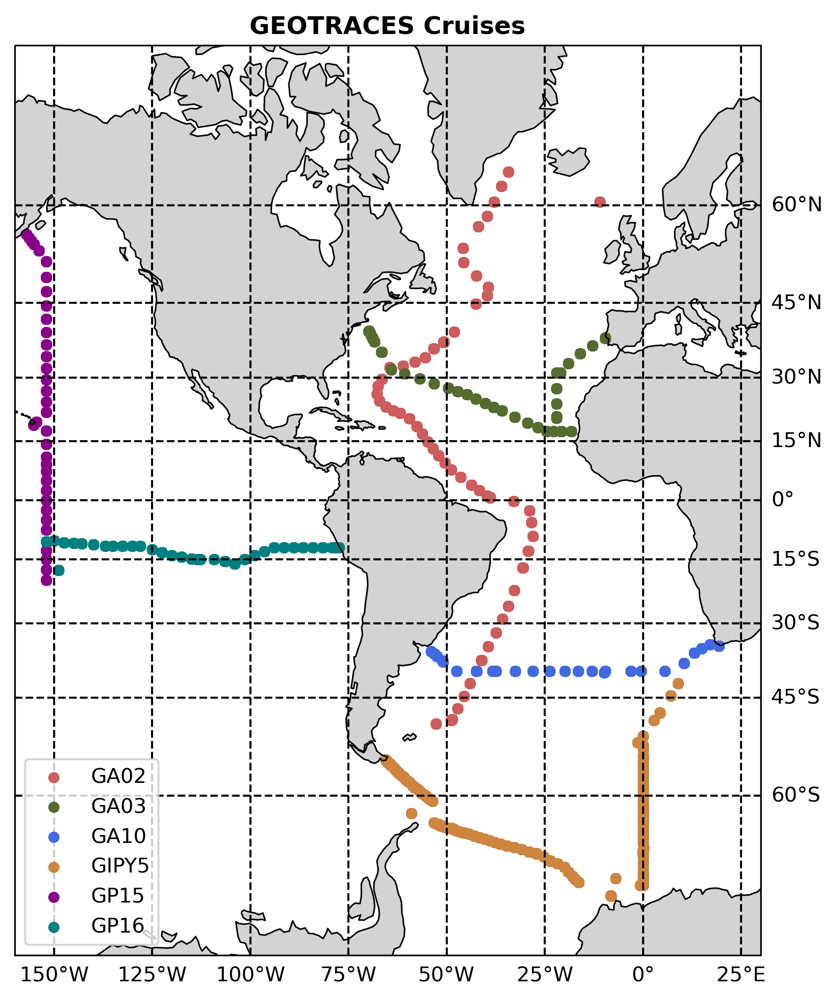

In [6]:
# create a global map of all GEOTRACES cruises focused on

fig = plt.figure(figsize = (10,8), dpi = 300)

ax = fig.add_subplot(1,1,1, projection = ccrs.Mercator(central_longitude = 0, min_latitude = -75, max_latitude = 75))

# (east, west, south, north) in terms of °E and °N
ax.set_extent([200, 30, -75, 75])

ax.set_title('GEOTRACES Cruises', color = 'k', weight = 'bold')

# add lines of latitude 
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels = True, linewidth = 1, color = 'k', linestyle = '--')
gl.xlabels_top = False
gl.ylabels_left = False

gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# mark lines of latitude
gl.ylocator = mticker.FixedLocator([-75, -60 , -45, -30, -15, 0, 15, 30, 45, 60, 75])

# coastlines and color
ax.coastlines(linewidth = 0.75, color = 'k')
#ax.add_feature(cp.feature.OCEAN, facecolor = 'powderblue')
ax.add_feature(cp.feature.LAND, facecolor = 'lightgrey')

# add bathymetry
#ax.add_feature(cp.feature.NaturalEarthFeature(category='physical', name='bathymetry_J_1000', scale='10m' ))

# plotting station locations of a cruise
nn = ax.scatter(GA02['Longitude [degrees_east]'], GA02['Latitude [degrees_north]'], c = 'indianred', s = 20, marker = 'o', label = 'GA02', transform = ccrs.PlateCarree())

# this one below is for adding another cruies subset ontop of the same map
nn = ax.scatter(GA03['Longitude [degrees_east]'], GA03['Latitude [degrees_north]'], c = 'darkolivegreen', s = 20, marker = 'o', label = 'GA03', transform = ccrs.PlateCarree())
nn = ax.scatter(GA10['Longitude [degrees_east]'], GA10['Latitude [degrees_north]'], c = 'royalblue', s = 20, marker = 'o', label = 'GA10', transform = ccrs.PlateCarree())
nn = ax.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['Latitude [degrees_north]'], c = 'peru', s = 20, marker = 'o', label = 'GIPY5', transform = ccrs.PlateCarree())
nn = ax.scatter(GP15['Longitude [degrees_east]'], GP15['Latitude [degrees_north]'], c = 'darkmagenta', s = 20, marker = 'o', label = 'GP15', transform = ccrs.PlateCarree())
nn = ax.scatter(GP16['Longitude [degrees_east]'], GP16['Latitude [degrees_north]'], c = 'teal', s = 20, marker = 'o', label = 'GP16', transform = ccrs.PlateCarree())


# plot legend to identify the cruises
plt.legend(loc='lower left', fontsize = "medium")

fig.savefig('GEOTRACES_cruise_map.png', dpi = 300)

## Plotting transect profiles for each cruise:

### GA02:  

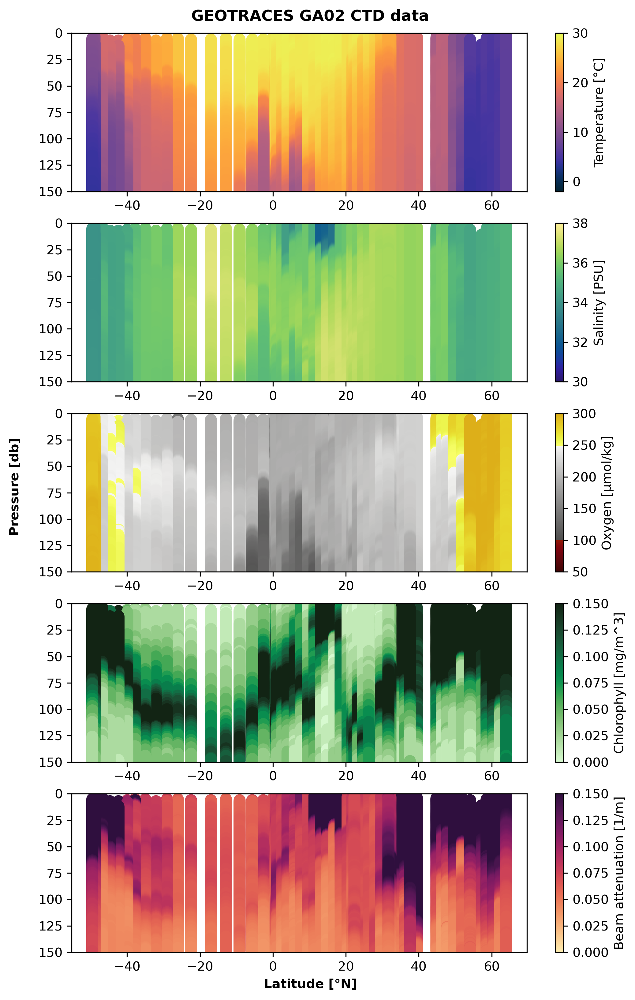

In [7]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GA02 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

plt.subplot(5, 1, 1)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')

plt.subplot(5, 1, 2)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')

plt.subplot(5, 1, 3)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')

plt.subplot(5, 1, 4)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDCHLA_T_CONC_SENSOR [mg/m^3]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb4 = plt.colorbar()
cb4.set_label('Chlorophyll [mg/m^3]')

plt.subplot(5, 1, 5)
plt.scatter(GA02['Latitude [degrees_north]'], GA02['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA02['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb5 = plt.colorbar()
cb5.set_label('Beam attenuation [1/m]')


fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')
fig.text(0.45, 0.08, 'Latitude [°N]', ha='center', weight = 'bold')

fig.savefig('GA02_section-150db.png', dpi = 300)

### GA10

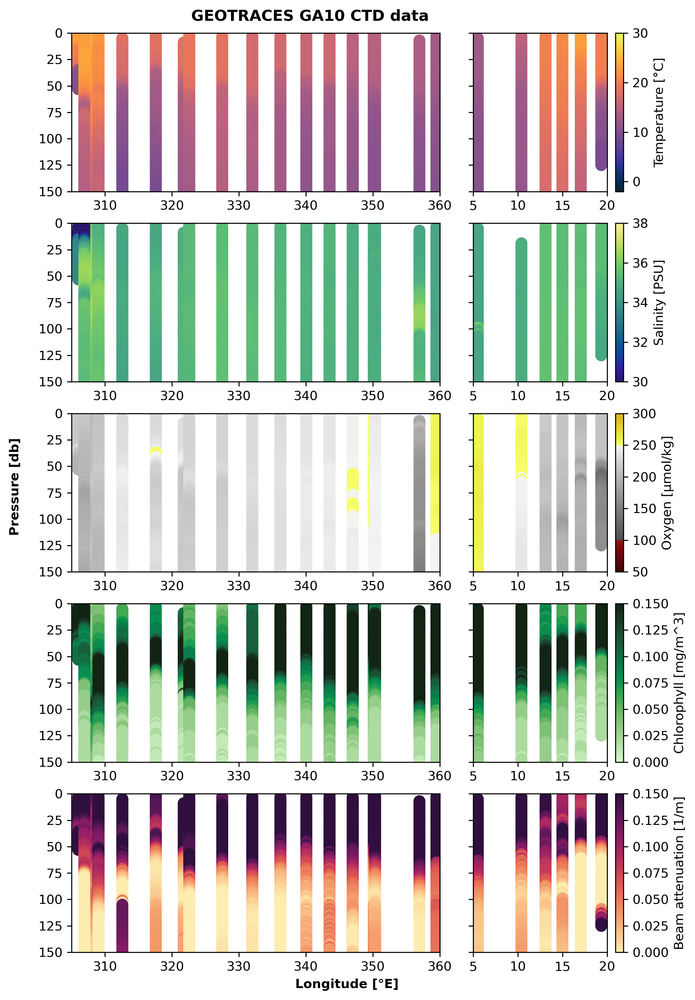

In [8]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GA10 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

# temperature
plt.subplot(5, 3, (1, 2))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.xlim([305, 360])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 3)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.xlim([5, 20])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')


# salinity
plt.subplot(5, 3, (4, 5))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.xlim([305, 360])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 6)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.xlim([5, 20])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')


# oxygen
plt.subplot(5, 3, (7, 8))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.xlim([305, 360])
plt.ylim([0, 150])
plt.gca().invert_yaxis()


plt.subplot(5, 3, 9)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.xlim([5, 20])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')


# chlorophyll
plt.subplot(5, 3, (10, 11))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDCHLA_T_CONC_SENSOR [mg/m^3]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.xlim([305, 360])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 12)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDCHLA_T_CONC_SENSOR [mg/m^3]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.xlim([5, 20])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Chlorophyll [mg/m^3]')


# beam attenuation
plt.subplot(5, 3, (13, 14))
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.xlim([305, 360])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 15)
plt.scatter(GA10['Longitude [degrees_east]'], GA10['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GA10['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.xlim([5, 20])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Beam attenuation [1/m]')


fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')
fig.text(0.5, 0.08, 'Longitude [°E]', ha='center', weight = 'bold')

fig.savefig('GA10_section-150db.png', dpi = 300)

### GA03

Because I know that GA03 has a longitudinal and latitudinal section, I want to plot them on separate x axes to get a better transect profile view....did this by pulling the date fom the latitudinal (N-S) section...could maybe be automated or simplified down the road.  

In [9]:
### Creatign a new GA03 section that just looks at the latitudinal (N-S) section only

GA03_lat_sec = pd.concat([sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-16T19:36:00')],
                          sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-18T10:36:00')],
                          sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-19T05:21:00')],
                          sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-21T16:00:00')],
                          sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-23T14:09:00')],
                          sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-24T09:51:00')],
                          sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-26T04:08:00')],
                          sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-27T21:20:00')],
                          sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2010-10-30T02:04:00')]])

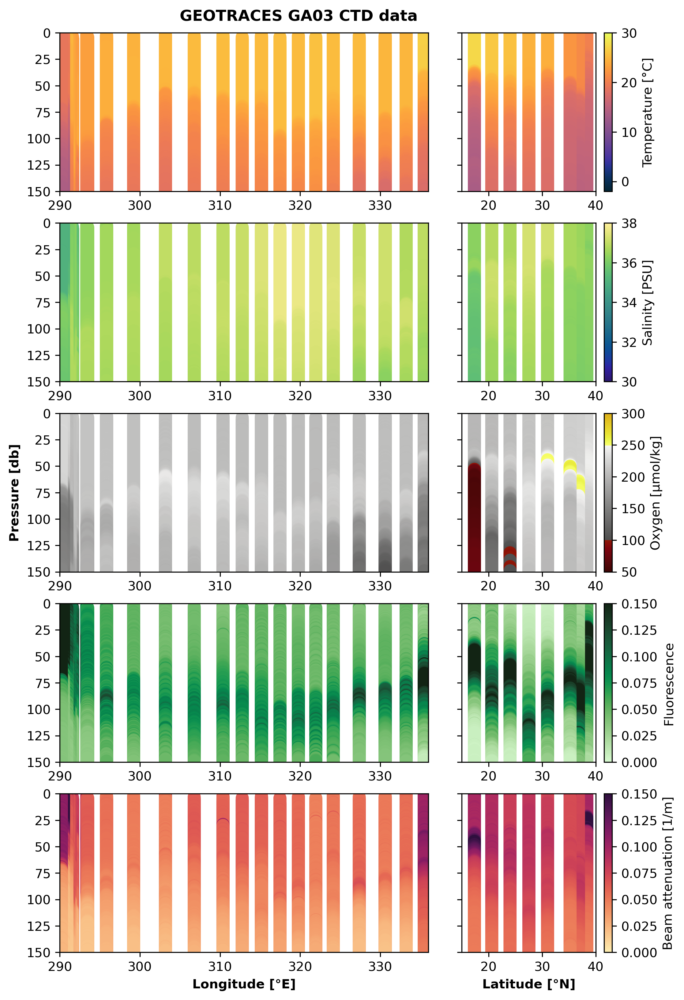

In [10]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GA03 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

# temperature
plt.subplot(5, 3, (1, 2))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.xlim([290, 336])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 3)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.xlim([15, 40])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')


# salinity
plt.subplot(5, 3, (4, 5))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.xlim([290, 336])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 6)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=30, vmax=38)
plt.xlim([15, 40])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')


# oxygen
plt.subplot(5, 3, (7, 8))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.xlim([290, 336])
plt.ylim([0, 150])
plt.gca().invert_yaxis()
plt.ylabel('Pressure [db]', fontweight = 'bold')

plt.subplot(5, 3, 9)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.xlim([15, 40])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')


# chlorophyll
plt.subplot(5, 3, (10, 11))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.xlim([290, 336])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(5, 3, 12)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.xlim([15, 40])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Fluorescence')


# beam attenuation
plt.subplot(5, 3, (13, 14))
plt.scatter(GA03['Longitude [degrees_east]'], GA03['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.xlim([290, 336])
plt.ylim([0, 150])
plt.gca().invert_yaxis()
plt.xlabel('Longitude [°E]', fontweight = 'bold')

plt.subplot(5, 3, 15)
plt.scatter(GA03_lat_sec['Latitude [degrees_north]'], GA03_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GA03_lat_sec['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.15)
plt.xlim([15, 40])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
plt.xlabel('Latitude [°N]', fontweight = 'bold')
cb3 = plt.colorbar()
cb3.set_label('Beam attenuation [1/m]')


fig.savefig('GA03_section-150db.png', dpi = 300)

### GIPY5

Because I know that GIPY5 also has a longitudinal and latitudinal section, I want to plot them on separate x axes to get a better transect profile view....did this by pulling the date fom the latitudinal (N-S) section...could maybe be automated or simplified down the road. 

In [11]:
### Creatign a new GIPY5 section that just looks at the latitudinal (N-S) section only

GIPY5_lat_sec = pd.concat([sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-14T00:49:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-15T06:17:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-17T02:20:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-17T13:50:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-19T09:38:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-20T01:07:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-20T10:28:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-21T01:19:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-21T14:29:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-21T20:01:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-22T01:46:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-22T14:05:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-22T21:07:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-23T03:53:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-23T12:05:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-24T04:46:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-25T09:05:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-25T13:28:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-25T17:56:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-26T08:06:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-26T22:36:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-27T09:00:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-27T14:36:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-28T04:16:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-29T01:31:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-02-29T14:50:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-07T14:54:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-08T19:27:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-09T21:28:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-10T11:00:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-10T21:18:00')],
                           sensor_150[sensor_150['yyyy-mm-ddThh:mm:ss.sss'].str.contains('2008-03-11T16:02:00')],
                          ])

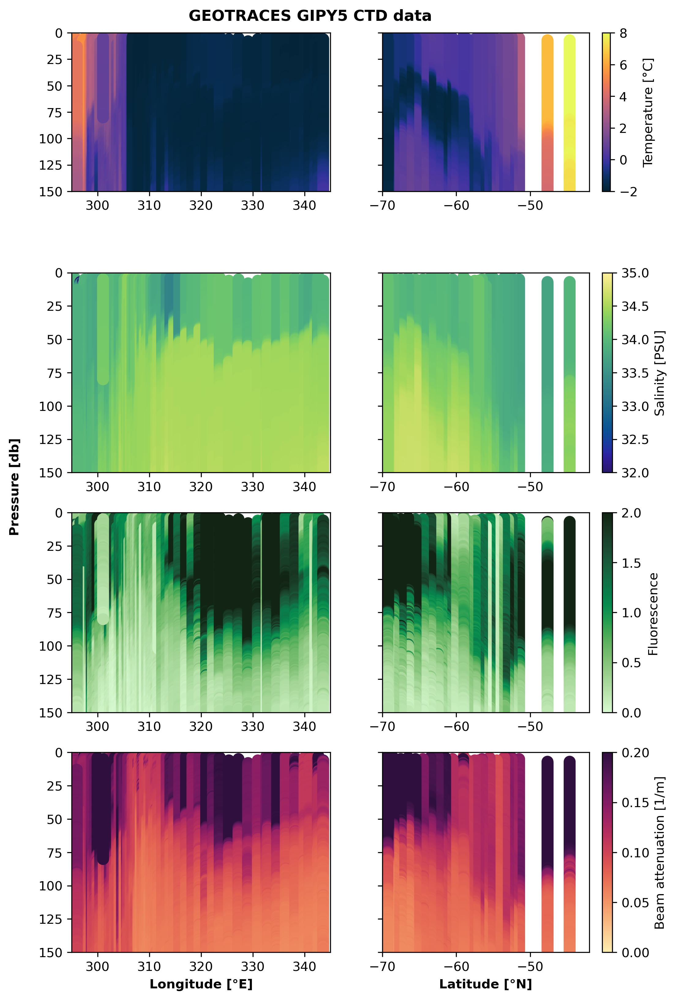

In [12]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GIPY5 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

# temperature
plt.subplot(5, 2, 1)
plt.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=8)
plt.xlim([295, 345])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(5, 2, 2)
plt.scatter(GIPY5_lat_sec['Latitude [degrees_north]'], GIPY5_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5_lat_sec['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=8)
plt.xlim([-70, -42])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')


# salinity
plt.subplot(4, 2, 3)
plt.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=32, vmax=35)
plt.xlim([295, 345])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(4, 2, 4)
plt.scatter(GIPY5_lat_sec['Latitude [degrees_north]'], GIPY5_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5_lat_sec['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=32, vmax=35)
plt.xlim([-70, -42])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')


# chlorophyll
plt.subplot(4, 2, 5)
plt.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=2)
plt.xlim([295, 345])
plt.ylim([0, 150])
plt.gca().invert_yaxis()

plt.subplot(4, 2, 6)
plt.scatter(GIPY5_lat_sec['Latitude [degrees_north]'], GIPY5_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5_lat_sec['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=2)
plt.xlim([-70, -42])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Fluorescence')


# beam attenuation
plt.subplot(4, 2, 7)
plt.scatter(GIPY5['Longitude [degrees_east]'], GIPY5['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.2)
plt.xlim([295, 345])
plt.ylim([0, 150])
plt.gca().invert_yaxis()
plt.xlabel('Longitude [°E]', fontweight = 'bold')

plt.subplot(4, 2, 8)
plt.scatter(GIPY5_lat_sec['Latitude [degrees_north]'], GIPY5_lat_sec['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 70, c = GIPY5_lat_sec['CTDBEAMCP_T_VALUE_SENSOR [1/m]'], cmap = cmocean.cm.matter, vmin=0, vmax=0.2)
plt.xlim([-70, -42])
plt.ylim([0, 150])
plt.gca().axes.yaxis.set_ticklabels([])
plt.gca().invert_yaxis()
plt.xlabel('Latitude [°N]', fontweight = 'bold')
cb3 = plt.colorbar()
cb3.set_label('Beam attenuation [1/m]')

fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')

fig.savefig('GIPY5_section-150db.png', dpi = 300)

### GP15

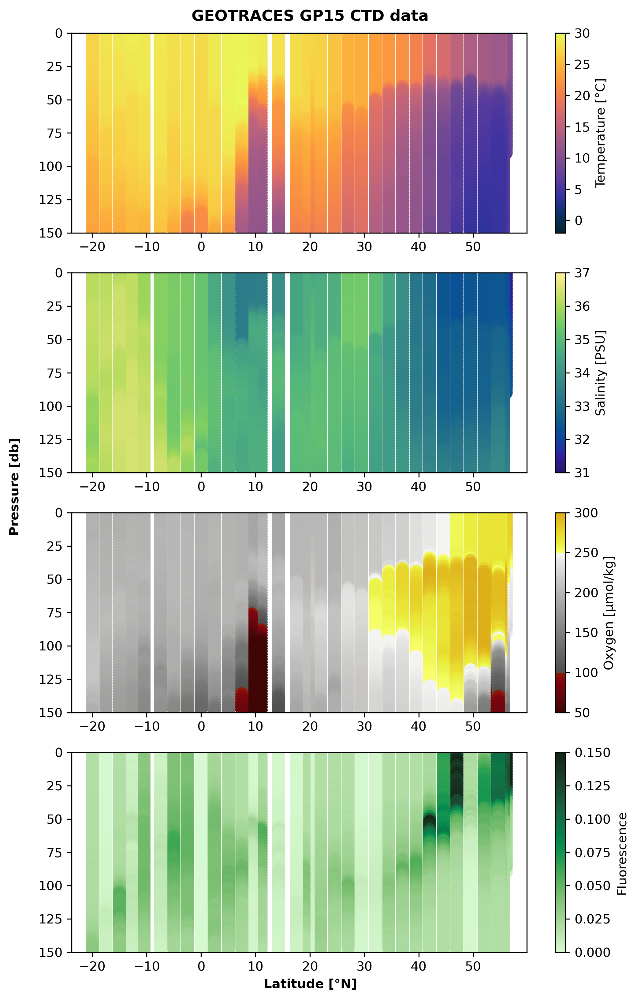

In [13]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GP15 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

plt.subplot(4, 1, 1)
plt.scatter(GP15['Latitude [degrees_north]'], GP15['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP15['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')

plt.subplot(4, 1, 2)
plt.scatter(GP15['Latitude [degrees_north]'], GP15['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP15['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=31, vmax=37)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')

plt.subplot(4, 1, 3)
plt.scatter(GP15['Latitude [degrees_north]'], GP15['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP15['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')

plt.subplot(4, 1, 4)
plt.scatter(GP15['Latitude [degrees_north]'], GP15['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP15['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb4 = plt.colorbar()
cb4.set_label('Fluorescence')


fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')
fig.text(0.45, 0.08, 'Latitude [°N]', ha='center', weight = 'bold')

fig.savefig('GP15_section-150db.png', dpi = 300)

### GP16

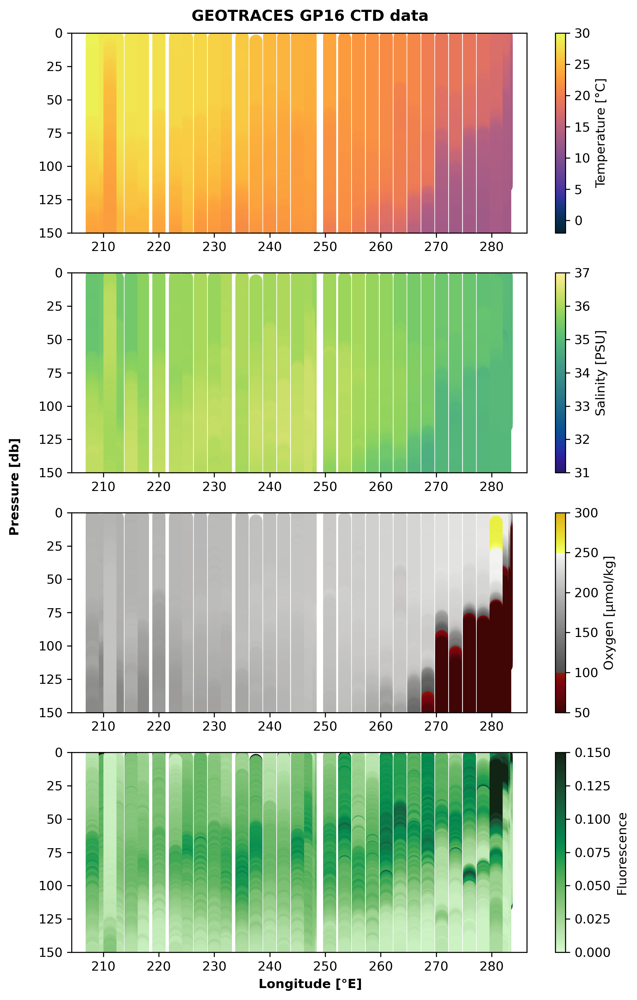

In [14]:
fig = plt.figure(figsize = (8,13), dpi = 300)
fig.suptitle('GEOTRACES GP16 CTD data', x=0.45, y=0.9, color = 'k', weight = 'bold')

plt.subplot(4, 1, 1)
plt.scatter(GP16['Longitude [degrees_east]'], GP16['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP16['CTDTMP_T_VALUE_SENSOR [deg C]'], cmap = cmocean.cm.thermal, vmin=-2, vmax=30)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb1 = plt.colorbar()
cb1.set_label('Temperature [°C]')

plt.subplot(4, 1, 2)
plt.scatter(GP16['Longitude [degrees_east]'], GP16['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP16['CTDSAL_D_CONC_SENSOR [pss-78]'], cmap = cmocean.cm.haline, vmin=31, vmax=37)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb2 = plt.colorbar()
cb2.set_label('Salinity [PSU]')

plt.subplot(4, 1, 3)
plt.scatter(GP16['Longitude [degrees_east]'], GP16['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP16['CTDOXY_D_CONC_SENSOR [umol/kg]'], cmap = cmocean.cm.oxy, vmin=50, vmax=300)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb3 = plt.colorbar()
cb3.set_label('Oxygen [µmol/kg]')

plt.subplot(4, 1, 4)
plt.scatter(GP16['Longitude [degrees_east]'], GP16['CTDPRS_T_VALUE_SENSOR [dbar]'], s = 85, c = GP16['CTDFLUOR_T_VALUE_SENSOR [arbitrary units]'], cmap = cmocean.cm.algae, vmin=0, vmax=0.15)
plt.ylim([0, 150])
plt.gca().invert_yaxis()
cb4 = plt.colorbar()
cb4.set_label('Fluorescence')


fig.text(0.04, 0.5, 'Pressure [db]', va='center', rotation='vertical', weight = 'bold')
fig.text(0.45, 0.08, 'Longitude [°E]', ha='center', weight = 'bold')

fig.savefig('GP16_section-150db.png', dpi = 300)